<a href="https://colab.research.google.com/github/diaputr/pcvk/blob/main/Week05_Kelompok_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum PCVK

**Kelompok 6**
1. Agus Prayogi (05 | 2141720025)

2. Diah Putri Nofianti (12 | 2141720054)

Kelas: TI-3A

In [66]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Gamma Correction

In [67]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt

path = '/content/drive/Shareddrives/Kita/TugasKul/SMT5/PCVK/Minggu 3/female.tiff'

 Gamma Correction pada citra 
-------------------------------
Masukkan nilai Gamma: 2


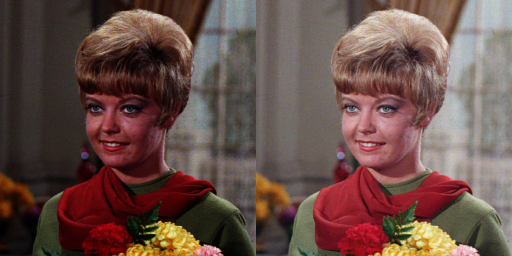

In [68]:
print(' Gamma Correction pada citra ')
print('-------------------------------')
try:
 gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
 print('Error, not a number')

ori = cv.imread(path)
gamma_correction = np.zeros(ori.shape, ori.dtype)

for y in range(ori.shape[0]):
  for x in range(ori.shape[1]):
    for c in range(ori.shape[2]):
      gamma_correction[y,x,c] = np.clip(255 * pow  (ori[y,x,c] / 255, (1 / gamma)), 0, 255)

final_frame = cv.hconcat((ori, gamma_correction))
cv2_imshow(final_frame)

## Image Depth

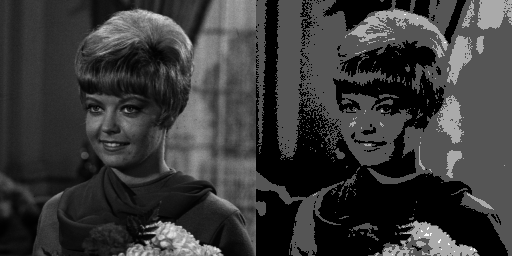

In [69]:
bit_depth = 2
level = 255 / (pow(2,bit_depth)-1)

original = cv.imread(path, cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
     depth_image[y,x] = np.clip(round(original[y,x] / level) * level, 0, 255);

final_frame = cv.hconcat((original, depth_image))
cv2_imshow(final_frame)

## Average Denoising

In [70]:
import glob

origin = cv.imread('/content/drive/Shareddrives/Kita/TugasKul/SMT5/PCVK/Minggu 5/galaxy.jpg')

cv_img = []
for img in glob.glob('/content/drive/Shareddrives/Kita/TugasKul/SMT5/PCVK/Minggu 5/noises/*.jpg'):
  n= cv.imread(img)
  cv_img.append(n)

In [71]:
def average_denoising(jum):

  img_sum = cv_img[0]
  for i in range(1, jum):
      alpha = 1.0 / (i + 1)
      beta = 1.0 - alpha
      image = cv_img[i]
      if image is not None:
          img_sum = cv.addWeighted(image, alpha, img_sum, beta, 0.0)

  return img_sum

In [72]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
      return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

### Jumlah Citra di Average = 5




Nilai PSNR adalah 27.534794277755744 (dB)


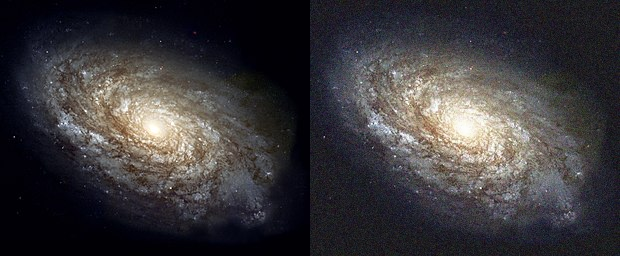

In [73]:
compressed = average_denoising(5)
psnr = PSNR(origin, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((origin, compressed))
cv2_imshow(galaxy_frame)

### Jumlah Citra di Average = 10

Nilai PSNR adalah 27.544415812461832 (dB)


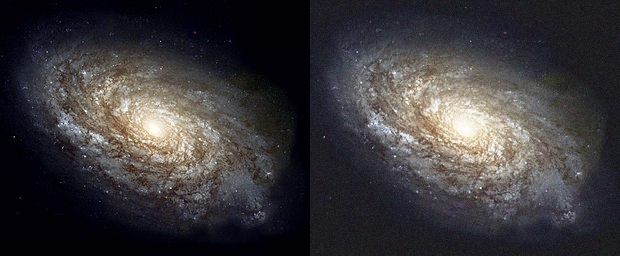

In [74]:
compressed = average_denoising(10)
psnr = PSNR(origin, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((origin, compressed))
cv2_imshow(galaxy_frame)

### Jumlah Citra di Average = 20

Nilai PSNR adalah 27.548278251013862 (dB)


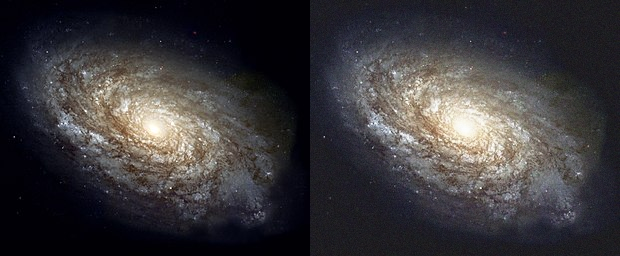

In [75]:
compressed = average_denoising(20)
psnr = PSNR(origin, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((origin, compressed))
cv2_imshow(galaxy_frame)

### Jumlah Citra di Average = 40

Nilai PSNR adalah 27.50082163738427 (dB)


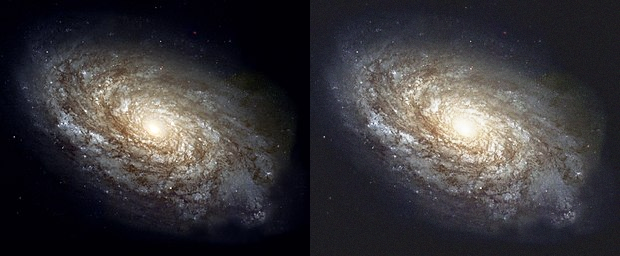

In [76]:
compressed = average_denoising(40)
psnr = PSNR(origin, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((origin, compressed))
cv2_imshow(galaxy_frame)

### Jumlah Citra di Average = 80

Nilai PSNR adalah 27.49901018055177 (dB)


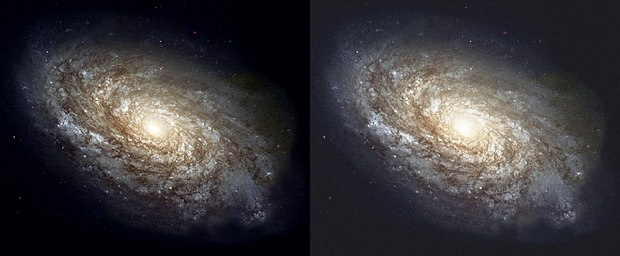

In [77]:
compressed = average_denoising(80)
psnr = PSNR(origin, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((origin, compressed))
cv2_imshow(galaxy_frame)

### Jumlah Citra di Average = 100

Nilai PSNR adalah 27.506734358987025 (dB)


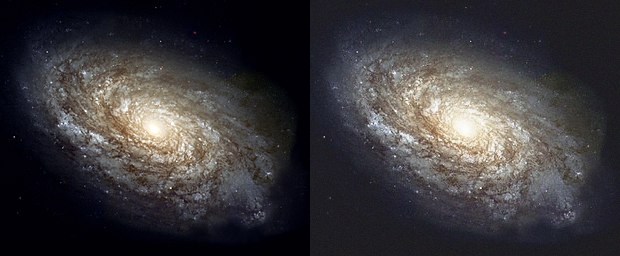

In [78]:
compressed = average_denoising(100)
psnr = PSNR(origin, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((origin, compressed))
cv2_imshow(galaxy_frame)

### Kesimpulan

* Average denoising adalah proses mengurangi noise atau gangguan pada citra digital dengan menggunakan rata-rata nilai piksel di sekitar piksel yang diproses.

* PSNR (Peak Signal to Noise Ratio) adalah ukuran kualitas citra yang telah di-denoising. PSNR menghitung perbandingan antara nilai maksimum piksel dengan rata-rata kuadrat error (MSE) antara citra asli dan citra yang telah di-denoising.

* Hubungan antara average denoising dan PSNR adalah berbanding terbalik. Semakin besar nilai rata-rata yang digunakan untuk denoising, semakin banyak noise yang dihilangkan, tetapi juga semakin banyak fitur penting yang terhapus.

* Sebaliknya, semakin kecil nilai rata-rata yang digunakan untuk denoising, semakin sedikit noise yang dihilangkan, tetapi juga semakin sedikit fitur penting yang terhapus.

## Image Masking (Kelompok 6) - Mulut

Ukuran gambar:  1242 x 800


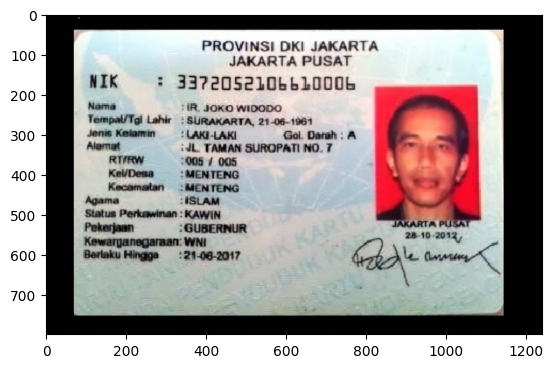

In [79]:
e_ktp = cv.imread('/content/drive/Shareddrives/Kita/TugasKul/SMT5/PCVK/KTP.jpeg')
ktp = cv.cvtColor(e_ktp, cv.COLOR_RGB2BGR)
plt.imshow(ktp)

height = e_ktp.shape[0]
width = e_ktp.shape[1]

print("Ukuran gambar: ", width, "x", height)

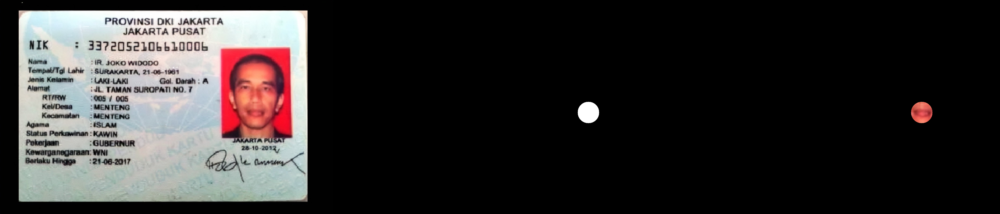

In [80]:
mask = np.zeros(ktp.shape, dtype = "uint8")
x, y = 950, 420
radius = 40
cv.circle(mask, (x, y), radius, (255, 255, 255), thickness=cv.FILLED)

masked_img = cv.bitwise_and(e_ktp, mask)

frame = cv.hconcat((e_ktp, mask, masked_img))
cv2_imshow(frame)

## Boolean Operation

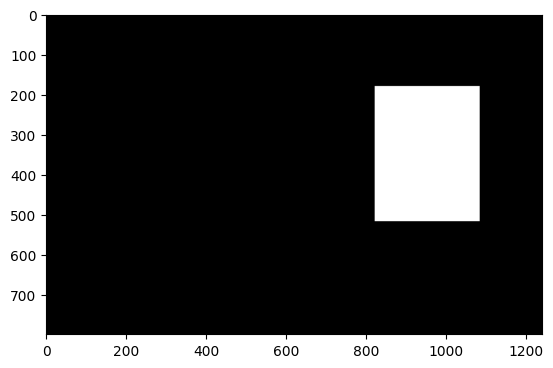

In [81]:
rec = np.zeros(ktp.shape, dtype = "uint8")
rectangle = cv.cvtColor(rec, cv.COLOR_RGB2BGR)
cv.rectangle(rectangle, (823,180), (1085,517), (255,255,255), -1)
plt.imshow(rectangle)

### NOT

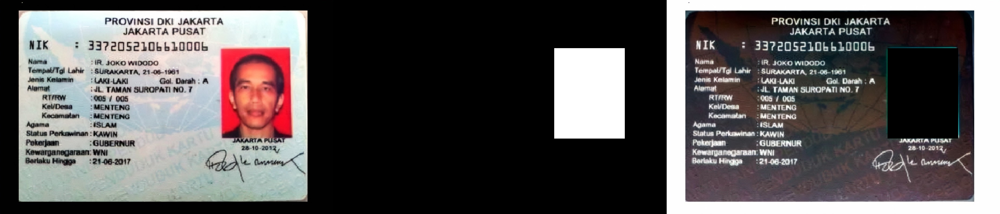

In [82]:
bitwiseNot = cv.bitwise_and(cv.bitwise_not(e_ktp), cv.bitwise_not(rectangle))
final_frame = cv.hconcat((e_ktp,rectangle,bitwiseNot))
cv2_imshow(final_frame)

Operasi NOT pada masking image menghasilkan negasi dari pixel pada gambar. Artinya, jika pixel pada gambar asli adalah putih, maka akan menjadi hitam setelah operasi NOT, dan sebaliknya.

### OR

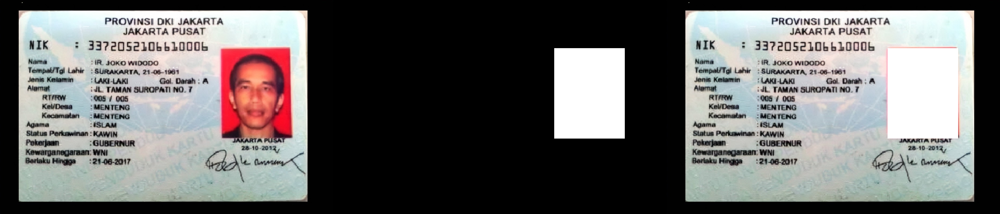

In [83]:
bitwiseOr = cv.bitwise_or(e_ktp, rectangle)
final_frame = cv.hconcat((e_ktp,rectangle,bitwiseOr))
cv2_imshow(final_frame)

Operasi OR ini saat maskingnya putih, maka area tersebut akan tertimpa putih dalam hasil gabungan, namun area lain tetap ditampilkan seperti aslinya.

### AND

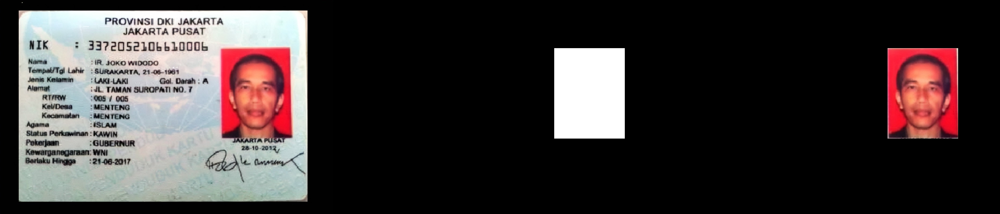

In [84]:
bitwiseAnd = cv.bitwise_and(e_ktp, rectangle)
final_frame = cv.hconcat((e_ktp,rectangle,bitwiseAnd))
cv2_imshow(final_frame)

Operasi AND hanya akan menampilkan area gambar yang tertindih masking yang berwarna putih.

### NAND

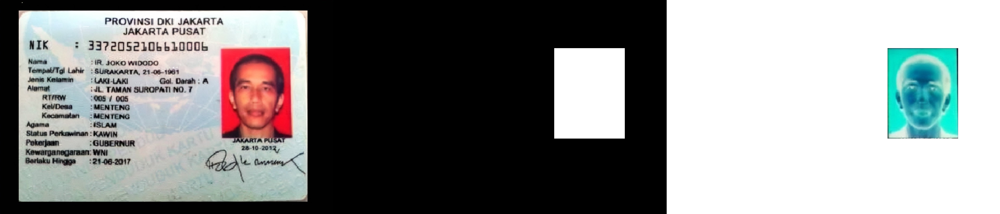

In [85]:
bitwiseNand = cv.bitwise_not(bitwiseAnd)
final_frame = cv.hconcat((e_ktp,rectangle,bitwiseNand))
cv2_imshow(final_frame)

NAND merupakan operasi NOT AND. Jadi, tinggal memberi negasi pada operasi AND di atasnya saja.

### XOR

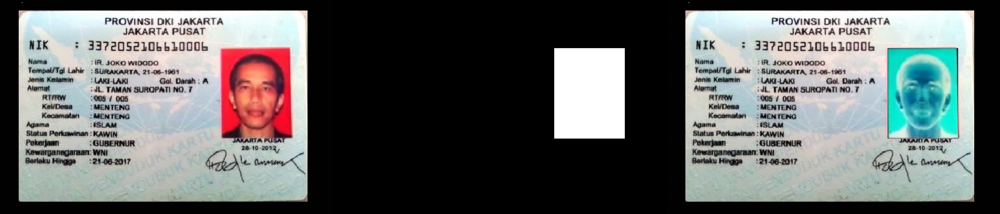

In [86]:
bitwiseXor = cv.bitwise_xor(e_ktp, rectangle)
final_frame = cv.hconcat((e_ktp,rectangle,bitwiseXor))
cv2_imshow(final_frame)

XOR sendiri adalah Eksklusif OR. Nah, area gambar yang tertindih masking putih akan ditampilkan warna negasinya, sedangkan area lain akan tetap seperti awalnya.